# Classifying Alzheimer Disease through Feature Analysis

Original Paper - https://ieeexplore.ieee.org/document/11041645

Dataset - https://www.kaggle.com/datasets/brsdincer/alzheimer-features/


**Another version of colab(improved performance)**:

Use only demented and nondemented group, drop converted group which may introduce noise and make the boundary not that clear

https://colab.research.google.com/drive/1N_CkOWYlKjEEvL2YLxS_ZuBVN-AgeYhO?usp=sharing

# Libraries installing

In [ ]:
!pip install lime shap catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.5 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=5e1fbe92fce1aa0452c64673c7ae18bc6524f9842c9c5ace4a4dea9dc6f93838
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import shap
import lime

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score,confusion_matrix, classification_report, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from collections import Counter

# Dataset loading

In [ ]:
df = pd.read_csv('alzheimer.csv')

In [ ]:
df.shape

(373, 10)

The dataset has 373 samples with 10 features

In [ ]:
df.head()

,Group,M/F,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,Nondemented,M,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,Nondemented,M,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,Demented,M,75,12,NaN,23.0,0.5,1678,0.736,1.046
3,Demented,M,76,12,NaN,28.0,0.5,1738,0.713,1.010
4,Demented,M,80,12,NaN,22.0,0.5,1698,0.701,1.034


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 373 entries, 0 to 372
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Group   373 non-null    object 
 1   M/F     373 non-null    object 
 2   Age     373 non-null    int64  
 3   EDUC    373 non-null    int64  
 4   SES     354 non-null    float64
 5   MMSE    371 non-null    float64
 6   CDR     373 non-null    float64
 7   eTIV    373 non-null    int64  
 8   nWBV    373 non-null    float64
 9   ASF     373 non-null    float64
dtypes: float64(5), int64(3), object(2)
memory usage: 29.3+ KB


In [ ]:
df.describe()

,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
count,373.000000,373.000000,354.000000,371.000000,373.000000,373.000000,373.000000,373.000000
mean,77.013405,14.597855,2.460452,27.342318,0.290885,1488.128686,0.729568,1.195461
std,7.640957,2.876339,1.134005,3.683244,0.374557,176.139286,0.037135,0.138092
min,60.000000,6.000000,1.000000,4.000000,0.000000,1106.000000,0.644000,0.876000
25%,71.000000,12.000000,2.000000,27.000000,0.000000,1357.000000,0.700000,1.099000
50%,77.000000,15.000000,2.000000,29.000000,0.000000,1470.000000,0.729000,1.194000
75%,82.000000,16.000000,3.000000,30.000000,0.500000,1597.000000,0.756000,1.293000
max,98.000000,23.000000,5.000000,30.000000,2.000000,2004.000000,0.837000,1.587000


# Initial data exploration

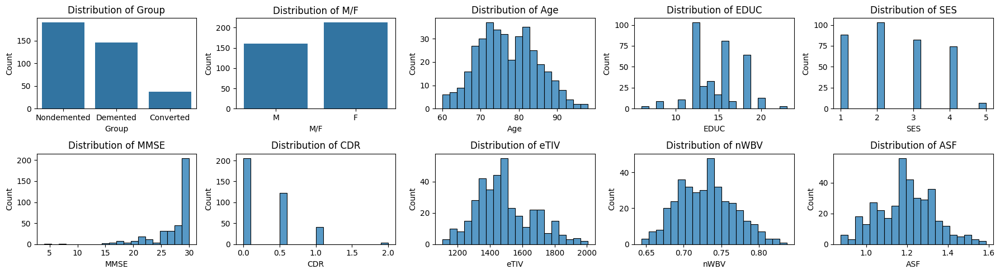

In [ ]:
# Distribution chart of each feature
numerical_cols = ['Age', 'EDUC', 'SES', 'MMSE', 'CDR', 'eTIV', 'nWBV', 'ASF']
categorical_cols = ['Group', 'M/F']
all_cols = categorical_cols + numerical_cols

# Set up the matplotlib figure
plt.figure(figsize=(18, 5))

# Loop through each column and plot distribution
for i, col in enumerate(all_cols):
    plt.subplot(2, 5, i + 1)

    if col in numerical_cols:
        sb.histplot(df[col].dropna(), bins=20)
        plt.ylabel("Count")
    else:
        sb.countplot(x=col, data=df)
        plt.ylabel("Count")

    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

plt.tight_layout()
plt.show()


#Preprocessing

##Handling Missing Values

From below, we can say that there are 19 missing values in SES and 2 missing values in MMSE.

In [ ]:
df.isnull().sum()

,0
Group,0
M/F,0
Age,0
EDUC,0
SES,19
MMSE,2
CDR,0
eTIV,0
nWBV,0
ASF,0


Observing the distribution of 'SES' and 'MMSE' to understand the strategy for imputing missing values.

From below graphs we can say that 'SES' is evenly distributed and we can use 'Mean' as the strategy for imputing, where as 'MMSE' is highly negatively skewed and has outliers, where median would be a better strategy for imputing.

In [ ]:
def plot_distribution(column_name):
    sb.histplot(df[column_name], kde=True, bins=20)
    plt.title(f"Distribution of {column_name}")
    plt.xlabel(column_name)
    plt.ylabel("Count")
    plt.show()

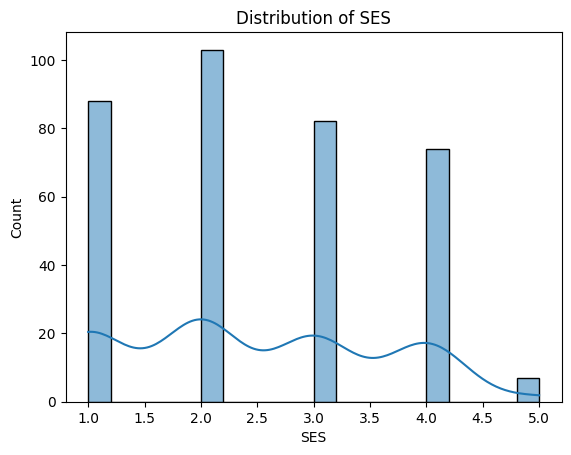

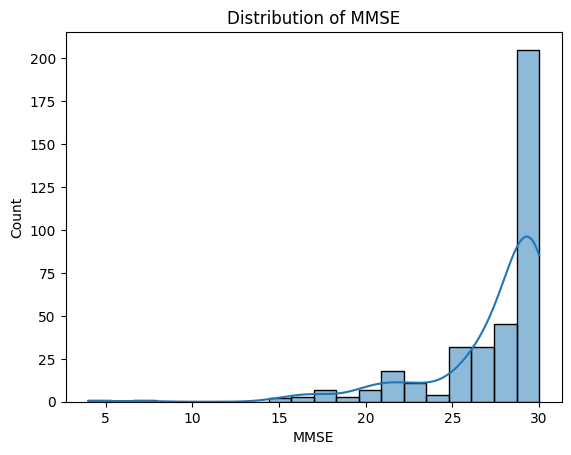

In [ ]:
plot_distribution('SES')
plot_distribution('MMSE')

In [ ]:
skew_value = df['SES'].skew()
print(f"Skewness of SES: {skew_value:.2f}")

Skewness of SES: 0.22


In [ ]:
skew_value = df['MMSE'].skew()
print(f"Skewness of MMSE: {skew_value:.2f}")

Skewness of MMSE: -2.37


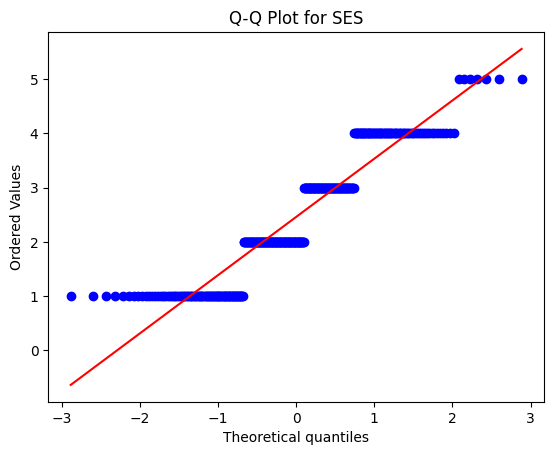

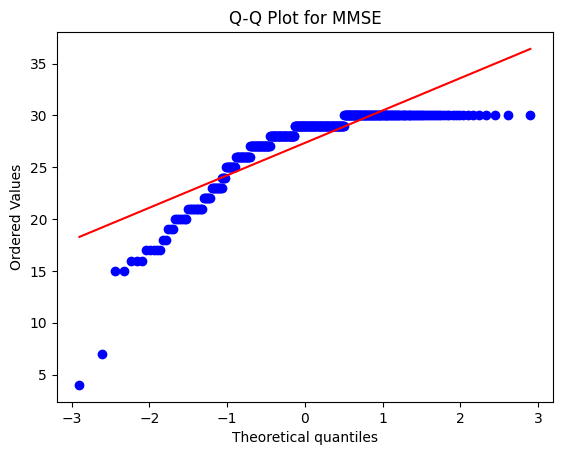

In [ ]:
import scipy.stats as stats

stats.probplot(df['SES'].dropna(), dist="norm", plot=plt)
plt.title("Q-Q Plot for SES")
plt.show()

stats.probplot(df['MMSE'].dropna(), dist="norm", plot=plt)
plt.title("Q-Q Plot for MMSE")
plt.show()

In [ ]:
# fill missing values in SES and MMSE columns with average
df['SES'] = df['SES'].fillna(df['SES'].mean())
df['MMSE'] = df['MMSE'].fillna(df['MMSE'].median())

In [ ]:
df.isna().sum().sum()

np.int64(0)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 373 entries, 0 to 372
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Group   373 non-null    object 
 1   M/F     373 non-null    object 
 2   Age     373 non-null    int64  
 3   EDUC    373 non-null    int64  
 4   SES     373 non-null    float64
 5   MMSE    373 non-null    float64
 6   CDR     373 non-null    float64
 7   eTIV    373 non-null    int64  
 8   nWBV    373 non-null    float64
 9   ASF     373 non-null    float64
dtypes: float64(5), int64(3), object(2)
memory usage: 29.3+ KB


In [ ]:
df2 = df.copy()

##Label Encoding

(Modified)The dataset has three variations of the target value, being Demented, Nondemented, and Converted. So, the labels are converted into two variations, for a binary classification task, creating the classes of 0 and 1, with 0 containing the Nondemented data, and 1 containing the Converted data and Demented data



In [ ]:
df['Group'] = df['Group'].map({'Nondemented': 0, 'Converted': 1, 'Demented': 1})

In [ ]:
df['M/F'] = df['M/F'].map({'M': 0, 'F': 1})

In [ ]:
print(df.head(10))

   Group  M/F  Age  EDUC       SES  MMSE  CDR  eTIV   nWBV    ASF
0      0    0   87    14  2.000000  27.0  0.0  1987  0.696  0.883
1      0    0   88    14  2.000000  30.0  0.0  2004  0.681  0.876
2      1    0   75    12  2.460452  23.0  0.5  1678  0.736  1.046
3      1    0   76    12  2.460452  28.0  0.5  1738  0.713  1.010
4      1    0   80    12  2.460452  22.0  0.5  1698  0.701  1.034
5      0    1   88    18  3.000000  28.0  0.0  1215  0.710  1.444
6      0    1   90    18  3.000000  27.0  0.0  1200  0.718  1.462
7      0    0   80    12  4.000000  28.0  0.0  1689  0.712  1.039
8      0    0   83    12  4.000000  29.0  0.5  1701  0.711  1.032
9      0    0   85    12  4.000000  30.0  0.0  1699  0.705  1.033


# Quick check on subjective features: CDR and MMSE

## Check CDR

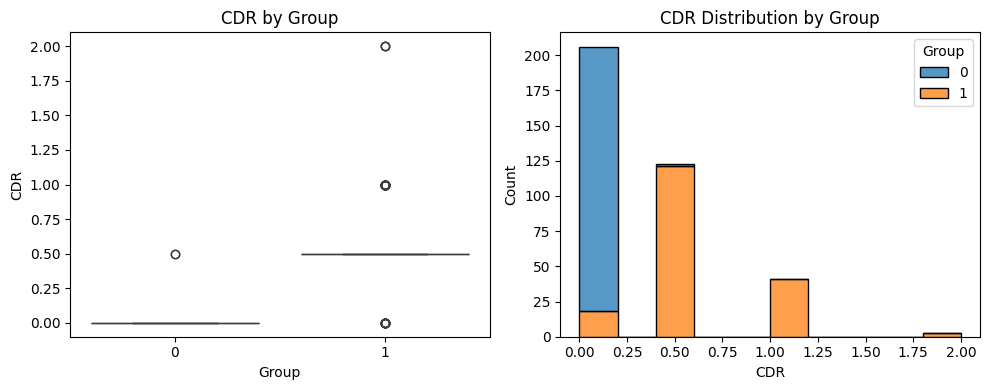

In [ ]:
# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# First subplot: Boxplot of CDR by Group
sb.boxplot(x='Group', y='CDR', data=df, ax=axes[0])
axes[0].set_title('CDR by Group')
axes[0].set_xlabel('Group')
axes[0].set_ylabel('CDR')

# Second subplot: Distribution of CDR colored by Group
sb.histplot(data=df, x='CDR', hue='Group', bins=10, multiple='stack', ax=axes[1]) # or multiple='dodge'
axes[1].set_title('CDR Distribution by Group')
axes[1].set_xlabel('CDR')
axes[1].set_ylabel('Count')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
# A quick model running on only one feature_CDR to check if it's cheating to use it

# Use CDR as the only feature
X = df[['CDR']]
y = df['Group']

# train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# train model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# evaluate
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.79      0.97      0.87        32
           1       0.97      0.81      0.89        43

    accuracy                           0.88        75
   macro avg       0.88      0.89      0.88        75
weighted avg       0.90      0.88      0.88        75

ROC-AUC: 0.8913517441860466


Using only one feature CDR:
ROC_AUC and accuracy are very high 0.88~0.89, means that CDR is highly predictive-strong evidence of target leakage. Using CDR as a feature to predict group target is like cheating which must be removed from our dataset.

## Check MMSE

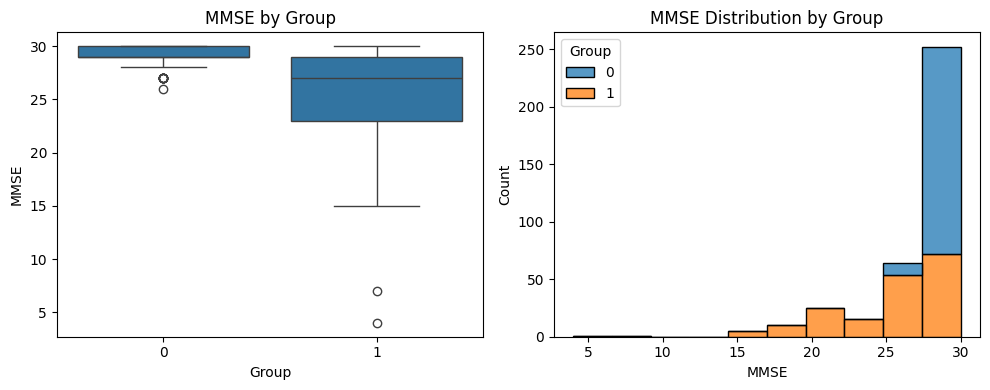

In [ ]:
# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# First subplot: Boxplot of MMSE by Group
sb.boxplot(x='Group', y='MMSE', data=df, ax=axes[0])
axes[0].set_title('MMSE by Group')
axes[0].set_xlabel('Group')
axes[0].set_ylabel('MMSE')

# Second subplot: Distribution of MMSE colored by Group
sb.histplot(data=df, x='MMSE', hue='Group', bins=10, multiple='stack', ax=axes[1]) # or multiple='dodge'
axes[1].set_title('MMSE Distribution by Group')
axes[1].set_xlabel('MMSE')
axes[1].set_ylabel('Count')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
# A quick model running on only one feature_MMSE to check if it's cheating to use it

# use only MMSE as feature
X = df[['MMSE']]
y = df['Group']

# train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# train model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# evaluate
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.64      0.88      0.74        32
           1       0.87      0.63      0.73        43

    accuracy                           0.73        75
   macro avg       0.75      0.75      0.73        75
weighted avg       0.77      0.73      0.73        75

ROC-AUC: 0.751453488372093


Using only one feature MMSE:
ROC_AUC and accuracy are pretty high 0.73~0.75, means that MMSE is also a highly predictive-strong evidence of target leakage. Using MMSE as a feature to predict group target is like cheating which must be also removed from our dataset for fairness.

# **Experiment 1**_Original process(key paper replication with all features)

In [ ]:
y = df['Group']
X = df.drop(['Group'], axis = 1)

In [ ]:
print(X.head(10))

   M/F  Age  EDUC       SES  MMSE  CDR  eTIV   nWBV    ASF
0    0   87    14  2.000000  27.0  0.0  1987  0.696  0.883
1    0   88    14  2.000000  30.0  0.0  2004  0.681  0.876
2    0   75    12  2.460452  23.0  0.5  1678  0.736  1.046
3    0   76    12  2.460452  28.0  0.5  1738  0.713  1.010
4    0   80    12  2.460452  22.0  0.5  1698  0.701  1.034
5    1   88    18  3.000000  28.0  0.0  1215  0.710  1.444
6    1   90    18  3.000000  27.0  0.0  1200  0.718  1.462
7    0   80    12  4.000000  28.0  0.0  1689  0.712  1.039
8    0   83    12  4.000000  29.0  0.5  1701  0.711  1.032
9    0   85    12  4.000000  30.0  0.0  1699  0.705  1.033


In [ ]:
print(y.head(10))

0    0
1    0
2    1
3    1
4    1
5    0
6    0
7    0
8    0
9    0
Name: Group, dtype: int64


Here we can observe that the data contains nearly double the counts of '0' to '1'.

In [ ]:
y.value_counts()

,count
Group,
0,190
1,183


##Train test split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

## Model Training

Classifier Models

In [ ]:
models = [
    "XGBoost",
    "LightGBM",
    "CatBoost"
]

classifiers = [
    XGBClassifier(),
    LGBMClassifier(verbosity=-1),
    CatBoostClassifier(verbose = False)
]

##Hyper-Parameter tuning

Parameter-grid for Hyper-parameter tuning

In [ ]:
parameters_grid = [
    {
        'xgbclassifier__n_estimators': [100, 200],
        'xgbclassifier__max_depth': [3, 5, 7],
        'xgbclassifier__learning_rate': [0.001, 0.01, 0.1],
        'xgbclassifier__subsample':[0.7, 0.8, 0.9],
        'xgbclassifier__colsample_bytree': [0.7, 0.8, 1.0],
        'xgbclassifier__min_child_weight': [1, 3, 5]
    },

    {
        'lgbmclassifier__n_estimators': [100, 200],
        'lgbmclassifier__max_depth': [3, 5, 7],
        'lgbmclassifier__learning_rate': [0.001, 0.01, 0.1],
        'lgbmclassifier__num_leaves': [31, 50, 70]
    },

    {
        'catboostclassifier__min_data_in_leaf': [20, 40, 60],
        'catboostclassifier__rsm': [0.7, 0.8, 1.0],
        'catboostclassifier__iterations': [100, 200],
        'catboostclassifier__depth': [3, 5, 7],
        'catboostclassifier__learning_rate': [0.001, 0.01, 0.1],
        'catboostclassifier__l2_leaf_reg': [1, 3, 5],
        'catboostclassifier__bagging_temperature': [0, 0.5, 1]
    }
]

In [ ]:
from sklearn.base import TransformerMixin, BaseEstimator

class DataFrameStandardScaler(TransformerMixin, BaseEstimator):
    def __init__(self):
        self.scaler = StandardScaler()
        self.columns = None

    def fit(self, X, y=None):
        self.columns = X.columns
        self.scaler.fit(X)
        return self

    def transform(self, X):
        scaled = self.scaler.transform(X)
        return pd.DataFrame(scaled, columns=self.columns, index=X.index)


In [ ]:
# A dictionary to store trained models
trained_models = {}

for name, clf, param_grid in zip(models, classifiers, parameters_grid):
  pipeline = make_pipeline(DataFrameStandardScaler(), clf)

  grid = GridSearchCV(pipeline, param_grid, cv = 5, scoring = 'accuracy')
  grid.fit(X_train, y_train)

  best_model = grid.best_estimator_

  # Storing the models with their best parameters for SHAP analysis
  trained_models[name] = {
      'model': best_model,
      'best_params': grid.best_params_
  }

  y_pred = best_model.predict(X_test)

  print("-------------------------------------------")

  print(name)
  print("Accuracy:", accuracy_score(y_test, y_pred))
  print("Precision:", precision_score(y_test, y_pred))
  print("Recall:", recall_score(y_test, y_pred))
  print("F1 Score:", f1_score(y_test, y_pred))
  print("AUC:", roc_auc_score(y_test, y_pred))
  print("Best Parameters:", grid.best_params_)

-------------------------------------------
XGBoost
Accuracy: 0.88
Precision: 0.9722222222222222
Recall: 0.813953488372093
F1 Score: 0.8860759493670886
AUC: 0.8913517441860466
Best Parameters: {'xgbclassifier__colsample_bytree': 0.7, 'xgbclassifier__learning_rate': 0.001, 'xgbclassifier__max_depth': 3, 'xgbclassifier__min_child_weight': 1, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.7}
-------------------------------------------
LightGBM
Accuracy: 0.88
Precision: 0.9722222222222222
Recall: 0.813953488372093
F1 Score: 0.8860759493670886
AUC: 0.8913517441860466
Best Parameters: {'lgbmclassifier__learning_rate': 0.001, 'lgbmclassifier__max_depth': 3, 'lgbmclassifier__n_estimators': 100, 'lgbmclassifier__num_leaves': 31}
-------------------------------------------
CatBoost
Accuracy: 0.88
Precision: 0.9722222222222222
Recall: 0.813953488372093
F1 Score: 0.8860759493670886
AUC: 0.8913517441860466
Best Parameters: {'catboostclassifier__bagging_temperature': 0, 'catboostc

##Cross-Validation

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold, cross_validate

print("Cross Validation: ")

scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

for i, (name, data) in enumerate(trained_models.items()):
    model = data['model']

    # Different random state for each model
    cv_different = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=42+i*10)

    scores = cross_validate(model, X_train, y_train, cv=cv_different, scoring=scoring)

    print(f"\n{name} (Random State {42+i*10}):")
    for metric in scoring.keys():
        mean_score = scores[f'test_{metric}'].mean()
        std_score = scores[f'test_{metric}'].std()
        print(f"{metric.capitalize()}: {mean_score:.3f} ± {std_score:.3f}")

Cross Validation: 

XGBoost (Random State 42):
Accuracy: 0.963 ± 0.021
Precision: 0.993 ± 0.014
Recall: 0.929 ± 0.051
F1: 0.959 ± 0.025
Roc_auc: 0.976 ± 0.018

LightGBM (Random State 52):
Accuracy: 0.963 ± 0.020
Precision: 0.993 ± 0.015
Recall: 0.929 ± 0.042
F1: 0.959 ± 0.023
Roc_auc: 0.953 ± 0.026

CatBoost (Random State 62):
Accuracy: 0.963 ± 0.021
Precision: 0.992 ± 0.015
Recall: 0.929 ± 0.039
F1: 0.959 ± 0.024
Roc_auc: 0.972 ± 0.021


##ROC Curve

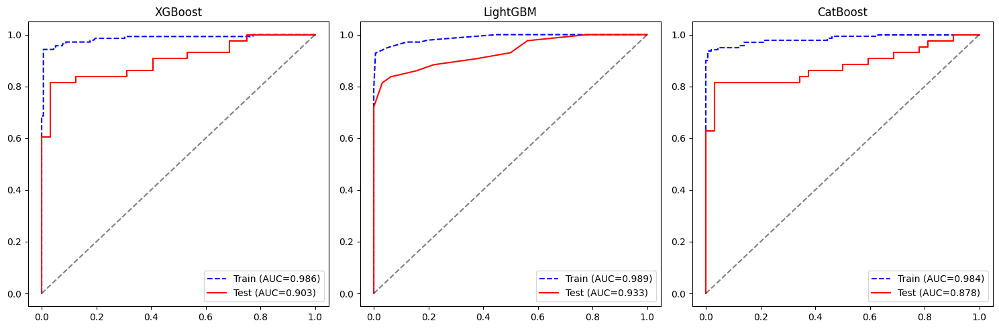

In [ ]:
from sklearn.metrics import roc_curve, auc

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, (name, data) in enumerate(trained_models.items()):
   # Train ROC
   y_train_proba = data['model'].predict_proba(X_train)[:, 1]
   fpr_train, tpr_train, _ = roc_curve(y_train, y_train_proba)
   axes[i].plot(fpr_train, tpr_train, 'b--', label=f'Train (AUC={auc(fpr_train, tpr_train):.3f})')

   # Test ROC
   y_test_proba = data['model'].predict_proba(X_test)[:, 1]
   fpr_test, tpr_test, _ = roc_curve(y_test, y_test_proba)
   axes[i].plot(fpr_test, tpr_test, 'r-', label=f'Test (AUC={auc(fpr_test, tpr_test):.3f})')

   axes[i].plot([0,1], [0,1], 'k--', alpha=0.5)
   axes[i].set_title(name)
   axes[i].legend()

plt.tight_layout()
plt.show()

##Confusion Matrix

In [ ]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Confusion Matrix:
 [[39  4]
 [ 0 32]]


##Classification Report

In [ ]:
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.91      0.95        43
           1       0.89      1.00      0.94        32

    accuracy                           0.95        75
   macro avg       0.94      0.95      0.95        75
weighted avg       0.95      0.95      0.95        75



##SHAP Analysis

###SHAP Bar plot


XGBoost - Best Parameters: {'xgbclassifier__colsample_bytree': 0.7, 'xgbclassifier__learning_rate': 0.001, 'xgbclassifier__max_depth': 3, 'xgbclassifier__min_child_weight': 1, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__subsample': 0.7}
SHAP values shape: (75, 9)
Data shape: (75, 9)


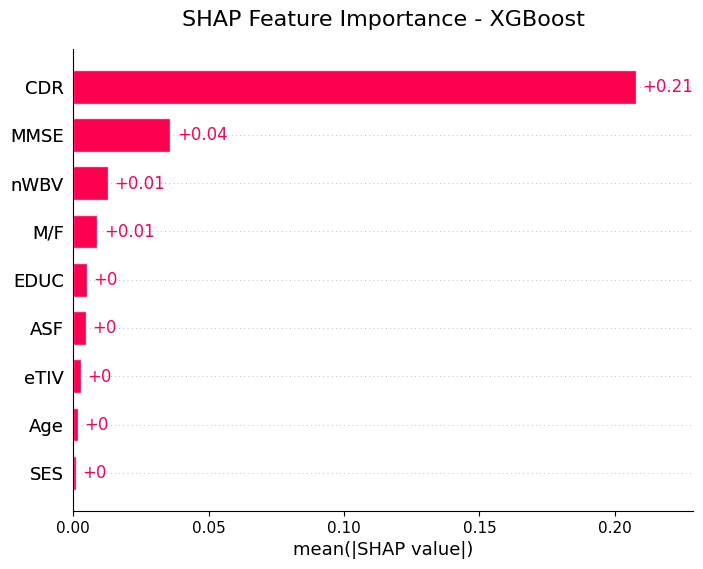


LightGBM - Best Parameters: {'lgbmclassifier__learning_rate': 0.001, 'lgbmclassifier__max_depth': 3, 'lgbmclassifier__n_estimators': 100, 'lgbmclassifier__num_leaves': 31}
SHAP values shape: (75, 9)
Data shape: (75, 9)


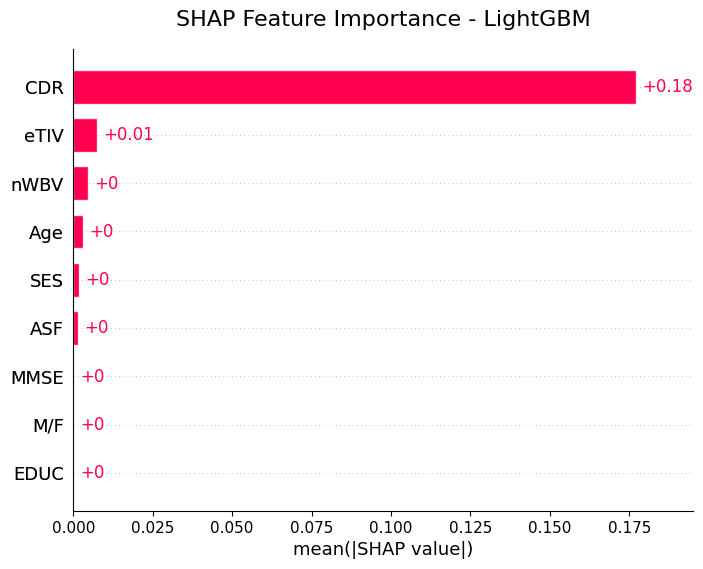


CatBoost - Best Parameters: {'catboostclassifier__bagging_temperature': 0, 'catboostclassifier__depth': 3, 'catboostclassifier__iterations': 100, 'catboostclassifier__l2_leaf_reg': 1, 'catboostclassifier__learning_rate': 0.001, 'catboostclassifier__min_data_in_leaf': 20, 'catboostclassifier__rsm': 0.7}
SHAP values shape: (75, 9)
Data shape: (75, 9)


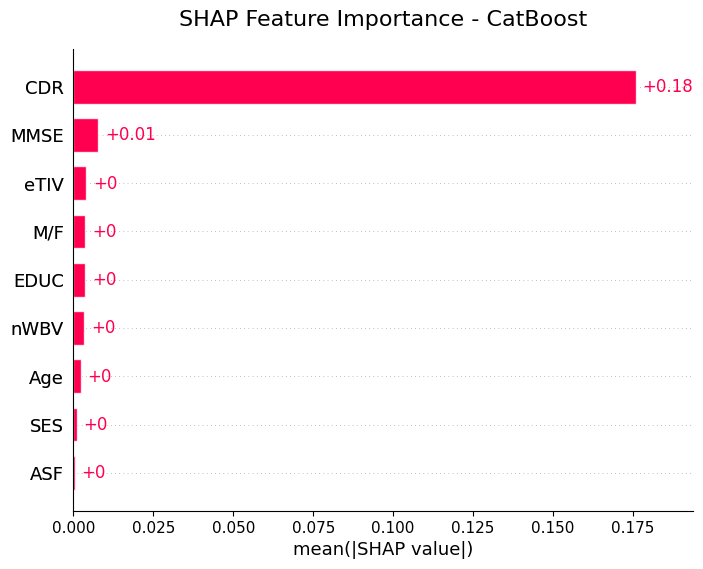

In [ ]:
for name, data in trained_models.items():
    model = data["model"].named_steps[list(data["model"].named_steps.keys())[-1]]
    explainer = shap.Explainer(model)
    shap_values = explainer(X_test)

    print(f"\n{name} - Best Parameters: {data['best_params']}")
    print(f"SHAP values shape: {shap_values.values.shape}")
    print(f"Data shape: {shap_values.data.shape}")

    fig = plt.figure(figsize=(10,6))
    plt.text(0.5, 1.05, f"SHAP Feature Importance - {name}", ha='center', fontsize=16, transform=plt.gca().transAxes)

    shap.plots.bar(shap_values)

###SHAP Beeswarm plot

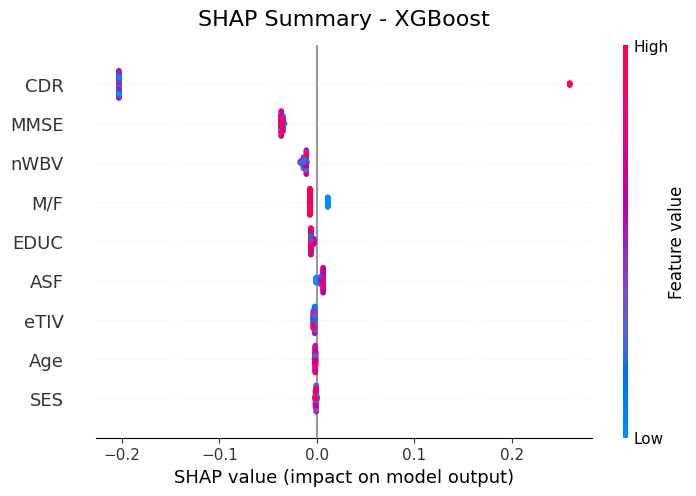

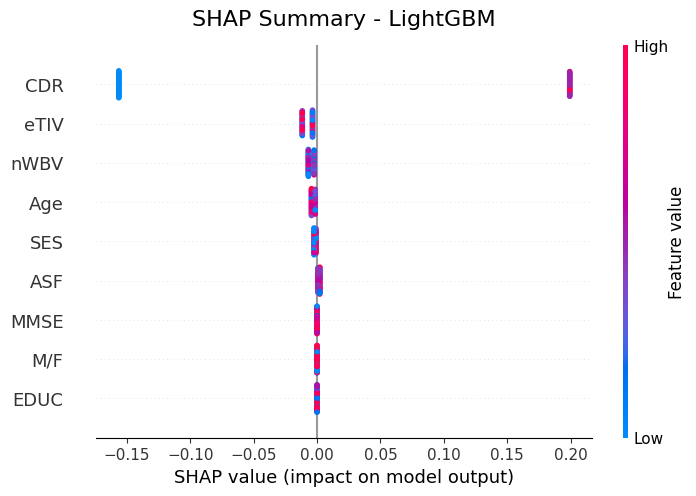

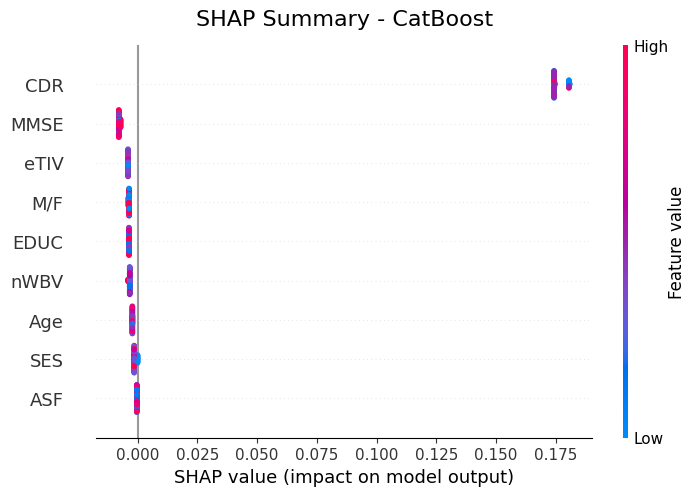

In [ ]:
for name, data in trained_models.items():
    model = data["model"].named_steps[list(data["model"].named_steps.keys())[-1]]
    explainer = shap.Explainer(model)
    shap_values = explainer(X_test)

    fig = plt.figure(figsize=(10,6))
    plt.text(0.5, 1.05, f"SHAP Summary - {name}", ha='center', fontsize=16, transform=plt.gca().transAxes)

    shap.plots.beeswarm(shap_values)

# Parallel Process(remove CDR and MMSE)

## Preprocessing

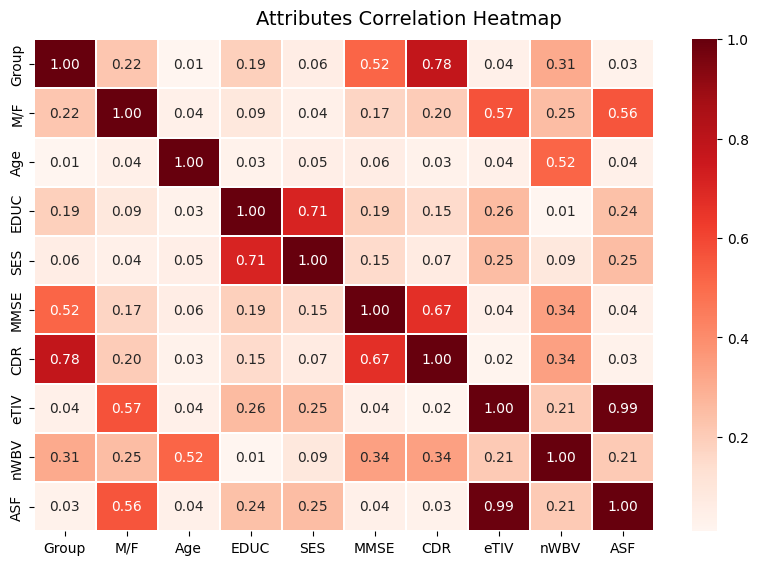

In [ ]:
# for visualizing correlations
f, ax = plt.subplots(figsize=(10, 6))
corr = df.corr().abs()
hm = sb.heatmap(round(corr,2), annot=True, ax=ax, cmap="Reds",fmt='.2f',
            linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Attributes Correlation Heatmap', fontsize=14)

ASF and ETIV are strongly related with correaltion coefficient 0.99 > 0.85(threshhold), which make sense because:

eTIV（Estimated Total Intracranial Volume）≈ Template Intracranial Volume * ASF (Atlas Scaling Factor),

we can consider keep only one of them.

In previous process, we found that use MMSE or CDR to predict is a possible cheating method, so we will remove both of them in our models.

In [ ]:
X = df.drop(['Group', 'CDR', 'MMSE', 'ASF'], axis = 1)
y = df['Group']

In [ ]:
# Split dataset into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features（skip this because we prefer to see the original data for better explanation）
#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_test = scaler.transform(X_test)

In [ ]:
X_test.columns

Index(['M/F', 'Age', 'EDUC', 'SES', 'eTIV', 'nWBV'], dtype='object')

## Model Training

Our main goal is to minimize FN, so recall could be the primary metric， then use F1 as secondary metric

### random forest(test only)

In [ ]:
# RF model training test
rf= RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

print("Random Forest: ")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": rf.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

Random Forest: 
              precision    recall  f1-score   support

           0       0.69      0.84      0.76        32
           1       0.86      0.72      0.78        43

    accuracy                           0.77        75
   macro avg       0.78      0.78      0.77        75
weighted avg       0.79      0.77      0.77        75

------------------------------------------------------
Accuracy: 0.7733333333333333
Precision: 0.8611111111111112
Recall: 0.7209302325581395
F1 Score: 0.7848101265822784
ROC_AUC: 0.7823401162790697
------------------------------------------------------


,Feature,Importance
5,nWBV,0.274275
4,eTIV,0.257460
1,Age,0.166571
2,EDUC,0.139762
3,SES,0.101333
0,M/F,0.060599


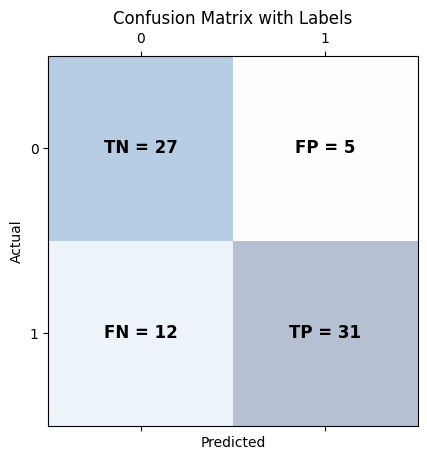

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

### XGBoost

In [ ]:
# Initialize a XGBoost classifier
XGBoost= XGBClassifier(random_state=42)

# Define the parameter grid for Grid
XGB_param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'min_child_weight': [1, 3, 5],
}

grid_search = GridSearchCV(XGBoost, XGB_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

XGBoost_mdl = grid_search.best_estimator_
y_pred = XGBoost_mdl.predict(X_test)

Best hyperparameters found by GridSearchCV:
{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9}


XGBoost Best hyperparameters found by GridSearchCV:
{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9}

In [ ]:
print("XGBoost: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": XGBoost_mdl.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

XGBoost: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.66      0.91      0.76        32
           1       0.90      0.65      0.76        43

    accuracy                           0.76        75
   macro avg       0.78      0.78      0.76        75
weighted avg       0.80      0.76      0.76        75

------------------------------------------------------
Accuracy: 0.76
Precision: 0.9032258064516129
Recall: 0.6511627906976745
F1 Score: 0.7567567567567568
ROC_AUC: 0.7787063953488372
------------------------------------------------------


,Feature,Importance
0,M/F,0.233283
2,EDUC,0.166845
5,nWBV,0.165508
3,SES,0.158159
1,Age,0.142185
4,eTIV,0.134020


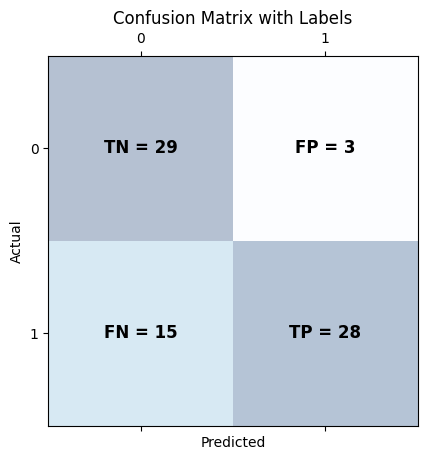

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

In [ ]:
# Find all FN indices in the full test set
FN_all = (~y_pred) & (y_test == 1)
FN_indices = y_test[FN_all].index
print("False Negative indices:", FN_indices)

# Find all FP indices in the full test set
FP_all = (y_pred) & (y_test == 0)
FP_indices = y_test[FP_all].index
print("False Positive indices:", FP_indices)

# Find all TP indices in the full test set
TP_all = (y_pred) & (y_test == 1)
TP_indices = y_test[TP_all].index
print("True Positive indices:", TP_indices)

# Find all FN indices in the full test set
TN_all = (~y_pred) & (y_test == 0)
TN_indices = y_test[TN_all].index
print("True Negative indices:", TN_indices)

False Negative indices: Index([76, 39, 72, 194, 369, 114, 297, 219, 218, 93, 77, 220, 208, 94, 195], dtype='int64')
False Positive indices: Index([278, 193, 145], dtype='int64')
True Positive indices: Index([327,  33,  15,  57, 239, 126, 233, 155, 231, 101, 237, 137, 225,  25,
       360, 176, 124,  90,  45, 345, 286, 250,   3,  78,  46,  73,  82, 347],
      dtype='int64')
True Negative indices: Index([314, 119, 305, 153,  55,   0, 335,   9, 180, 255, 108,  42, 288,  63,
        22, 152, 249,  30, 109,  56,   5, 353, 351, 132, 310, 229, 326, 311,
       292],
      dtype='int64')


In [ ]:
FN_sample_test_idx = X_test.index.get_indexer_for([76, 39, 72, 194, 369, 114, 297, 219, 218, 93, 77, 220, 208, 94, 195])
FP_sample_test_idx = X_test.index.get_indexer_for([278, 193, 145])
TP_sample_test_idx = X_test.index.get_indexer_for([327,  33,  15,  57, 239, 126, 233, 155, 231, 101, 237, 137, 225,  25,
       360, 176, 124,  90,  45, 345, 286, 250,   3,  78,  46,  73,  82, 347])
TN_sample_test_idx = X_test.index.get_indexer_for([314, 119, 305, 153,  55,   0, 335,   9, 180, 255, 108,  42, 288,  63,
        22, 152, 249,  30, 109,  56,   5, 353, 351, 132, 310, 229, 326, 311,
       292])

In [ ]:
print("FN_sample_test_idx: ", FN_sample_test_idx)
print("FP_sample_test_idx: ", FP_sample_test_idx)
print("TP_sample_test_idx: ", TP_sample_test_idx)
print("TN_sample_test_idx: ", TN_sample_test_idx)

FN_sample_test_idx:  [ 6 11 22 27 29 35 41 43 53 56 59 64 68 70 71]
FP_sample_test_idx:  [15 28 51]
TP_sample_test_idx:  [ 0  1  2  4  5  9 10 14 17 19 23 25 26 30 33 39 45 46 49 50 52 54 57 62
 63 65 69 74]
TN_sample_test_idx:  [ 3  7  8 12 13 16 18 20 21 24 31 32 34 36 37 38 40 42 44 47 48 55 58 60
 61 66 67 72 73]


In [ ]:
XGB_explainer = shap.Explainer(XGBoost_mdl)
XGB_shap = XGB_explainer(X_test)
print(type(XGB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (XGB_shap.values.shape,))
print("Data dimensions:   %s" % (XGB_shap.data.shape,))

Values dimensions: (75, 6)
Data dimensions:   (75, 6)


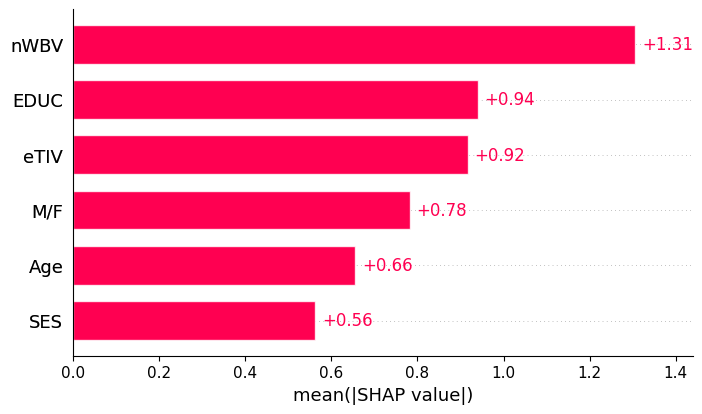

In [ ]:
sb.reset_orig()
shap.plots.bar(XGB_shap)

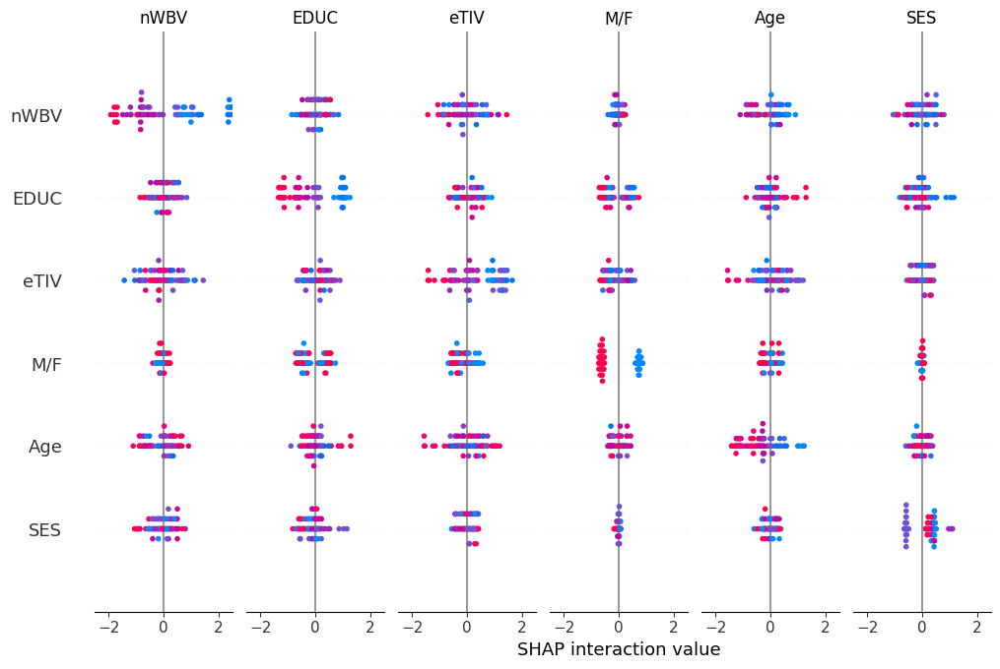

In [ ]:
# Compute SHAP interaction values
XGB_shap_interaction_values = XGB_explainer.shap_interaction_values(X_test)

# Visualize pairwise interactions (summary plot)
shap.summary_plot(XGB_shap_interaction_values, X_test)

In [ ]:
interaction_values = XGB_shap_interaction_values
features = X_test.columns

mean_abs_interactions = np.abs(interaction_values).mean(axis=0)

interaction_df = pd.DataFrame(mean_abs_interactions, index=features, columns=features)
interaction_df = interaction_df.where(np.triu(np.ones(interaction_df.shape), k=1).astype(bool))

interaction_df = interaction_df.stack().reset_index()
interaction_df.columns = ['Feature 1', 'Feature 2', 'Mean |Interaction Value|']
interaction_df = interaction_df.sort_values(by='Mean |Interaction Value|', ascending=False)

print(interaction_df.head(10))

   Feature 1 Feature 2  Mean |Interaction Value|
7        Age      eTIV                  0.241632
14      eTIV      nWBV                  0.232034
1        M/F      EDUC                  0.209921
8        Age      nWBV                  0.197576
13       SES      nWBV                  0.169432
10      EDUC      eTIV                  0.165446
3        M/F      eTIV                  0.159818
11      EDUC      nWBV                  0.147614
9       EDUC       SES                  0.145254
5        Age      EDUC                  0.133499


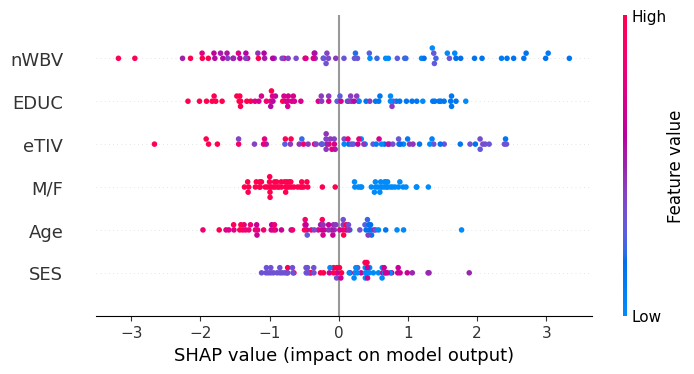

In [ ]:
shap.plots.beeswarm(XGB_shap)

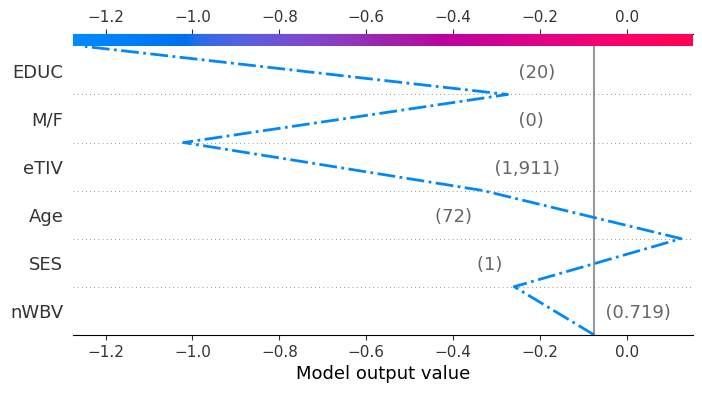

In [ ]:
# FN -11
expected_value = XGB_explainer.expected_value
shap.decision_plot(expected_value, XGB_shap.values[11], X_test.iloc[11], highlight=0)

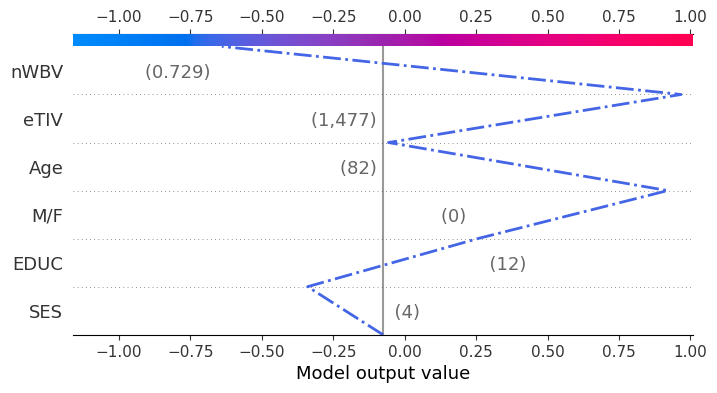

In [ ]:
# FN -22
expected_value = XGB_explainer.expected_value
shap.decision_plot(expected_value, XGB_shap.values[22], X_test.iloc[22], highlight=0)

In [ ]:
# FN -11
shap.initjs()
expected_value = XGB_explainer.expected_value
shap.force_plot(expected_value, XGB_shap.values[11], X_test.iloc[11])

In [ ]:
# FN -22
shap.initjs()
expected_value = XGB_explainer.expected_value
shap.force_plot(expected_value, XGB_shap.values[22], X_test.iloc[22])

In [ ]:
lime_XGB_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,
                                                   feature_names=X_test.columns,
                                                   class_names=['Nondemented', 'Demented'])

In [ ]:
# FN case -11
lime_XGB_explainer.explain_instance(X_test.iloc[11].values,\
                                    XGBoost_mdl.predict_proba,\
                                    num_features=11).\
                                show_in_notebook(predict_proba=True)

In [ ]:
# FN case-22
lime_XGB_explainer.explain_instance(X_test.iloc[22].values,\
                                    XGBoost_mdl.predict_proba,\
                                    num_features=22).\
                                show_in_notebook(predict_proba=True)

In [ ]:
# store all fn_results
fn_results = []
feature_counter = Counter()

FN_indices = [6, 11, 22, 27, 29, 35, 41, 43, 53, 56, 59, 64, 68, 70, 71]

for fn_idx in FN_indices:
    instance_values = X_test.iloc[fn_idx].values

    exp = lime_XGB_explainer.explain_instance(
        instance_values,
        XGBoost_mdl.predict_proba,
        num_features=6
    )

    exp_list = exp.as_list()

    pushed_non = [f for f, w in exp_list if w < 0]
    pushed_dem = [f for f, w in exp_list if w > 0]

    fn_results.append({
        'Index': fn_idx,
        'Pushed_Nondemented': pushed_non,
        'Pushed_Demented': pushed_dem
    })

    feature_counter.update(pushed_non)

fn_df = pd.DataFrame(fn_results)

top_causes = pd.DataFrame(feature_counter.most_common(), columns=['Feature', 'Count'])

print(fn_df.head())

print("\n=== False Negative Feature Frequency ===")
print(top_causes)

   Index                                 Pushed_Nondemented  \
0      6  [0.00 < M/F <= 1.00, EDUC > 16.00, 0.72 < nWBV...   
1     11        [EDUC > 16.00, eTIV > 1535.50, SES <= 2.00]   
2     22  [0.72 < nWBV <= 0.75, 81.00 < Age <= 85.00, SE...   
3     27  [0.00 < M/F <= 1.00, 0.72 < nWBV <= 0.75, 81.0...   
4     29  [eTIV > 1535.50, Age > 85.00, 15.00 < EDUC <= ...   

                                    Pushed_Demented  
0           [eTIV <= 1363.00, 73.50 < Age <= 81.00]  
1  [M/F <= 0.00, Age <= 73.50, 0.70 < nWBV <= 0.72]  
2                      [M/F <= 0.00, EDUC <= 12.00]  
3        [EDUC <= 12.00, 1363.00 < eTIV <= 1445.00]  
4                       [nWBV <= 0.70, M/F <= 0.00]  

=== False Negative Feature Frequency ===
                      Feature  Count
0          0.00 < M/F <= 1.00     12
1                 SES <= 2.00     12
2        81.00 < Age <= 85.00      8
3         0.72 < nWBV <= 0.75      7
4       15.00 < EDUC <= 16.00      5
5                EDUC > 16.00    

### LightGBM

In [ ]:
# Initialize a LightGBM classifier
LightGBM= LGBMClassifier(random_state=42)

# Define the parameter grid for Grid
LightGBM_param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'num_leaves': [31, 50, 70],
}

grid_search = GridSearchCV(LightGBM, LightGBM_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

LightGBM_mdl = grid_search.best_estimator_
y_pred = LightGBM_mdl.predict(X_test)

[LightGBM] [Info] Number of positive: 140, number of negative: 158
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 219
[LightGBM] [Info] Number of data points in the train set: 298, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.469799 -> initscore=-0.120953
[LightGBM] [Info] Start training from score -0.120953
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

LightGBM Best hyperparameters found by GridSearchCV:
{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'num_leaves': 31}

In [ ]:
print("LightGBM: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": LightGBM_mdl.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

LightGBM: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.60      0.84      0.70        32
           1       0.83      0.58      0.68        43

    accuracy                           0.69        75
   macro avg       0.72      0.71      0.69        75
weighted avg       0.73      0.69      0.69        75

------------------------------------------------------
Accuracy: 0.6933333333333334
Precision: 0.8333333333333334
Recall: 0.5813953488372093
F1 Score: 0.684931506849315
ROC_AUC: 0.7125726744186047
------------------------------------------------------


,Feature,Importance
4,eTIV,557
5,nWBV,385
1,Age,345
2,EDUC,205
3,SES,152
0,M/F,60


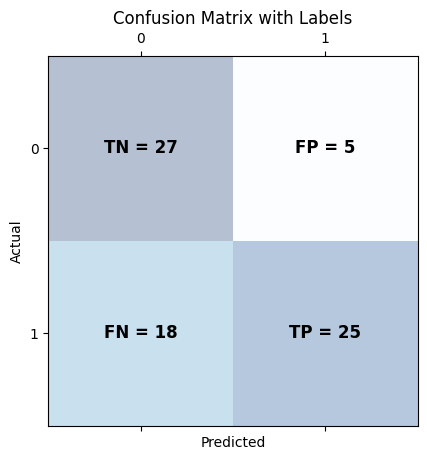

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

In [ ]:
# Find all FN indices in the full test set
FN_all = (~y_pred) & (y_test == 1)
FN_indices = y_test[FN_all].index
print("False Negative indices:", FN_indices)

False Negative indices: Index([ 76,  39,  72, 225, 194, 369, 114, 297, 219, 345, 218,  93,  77,  78,
       220, 208,  94, 195],
      dtype='int64')


In [ ]:
FN_sample_test_idx = X_test.index.get_indexer_for([76,  39,  72, 225, 194, 369, 114, 297, 219, 345, 218,  93,  77,  78,
       220, 208,  94, 195])
FN_sample_test_idx

array([ 6, 11, 22, 26, 27, 29, 35, 41, 43, 50, 53, 56, 59, 62, 64, 68, 70,
       71])

In [ ]:
LGB_explainer = shap.Explainer(LightGBM_mdl)
LGB_shap = LGB_explainer(X_test)
print(type(LGB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (LGB_shap.values.shape,))
print("Data dimensions:   %s" % (LGB_shap.data.shape,))

Values dimensions: (75, 6)
Data dimensions:   (75, 6)


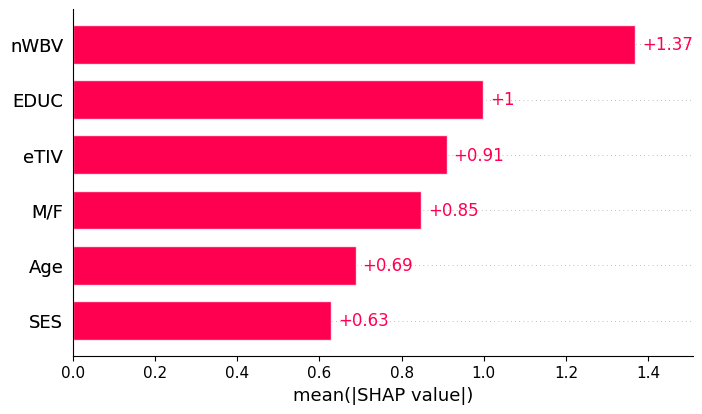

In [ ]:
sb.reset_orig()
shap.plots.bar(LGB_shap)

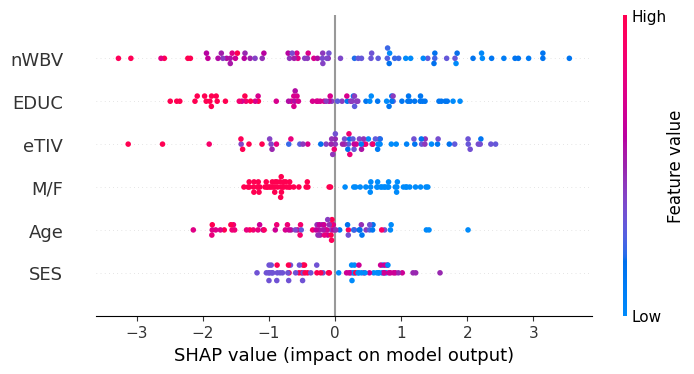

In [ ]:
shap.plots.beeswarm(LGB_shap)

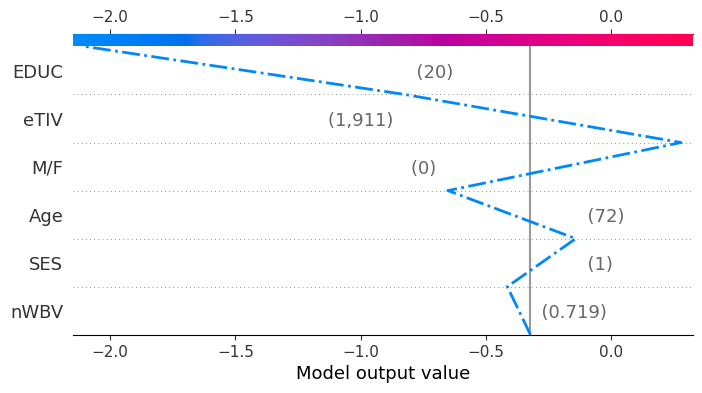

In [ ]:
# LGB-FN-11
expected_value = LGB_explainer.expected_value
shap.decision_plot(expected_value, LGB_shap.values[11], X_test.iloc[11], highlight=0)

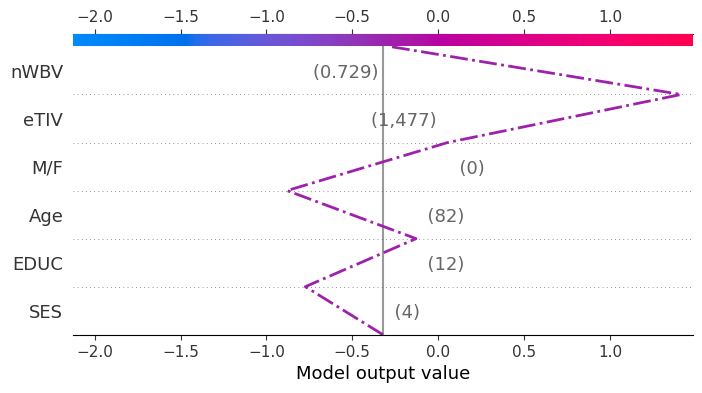

In [ ]:
# LGB-FN-22
expected_value = LGB_explainer.expected_value
shap.decision_plot(expected_value, LGB_shap.values[22], X_test.iloc[22], highlight=0)

In [ ]:
# LGB-FN-11
shap.initjs()
expected_value = LGB_explainer.expected_value
shap.force_plot(expected_value, LGB_shap.values[11], X_test.iloc[11])

In [ ]:
# LGB-FN-22
shap.initjs()
expected_value = LGB_explainer.expected_value
shap.force_plot(expected_value, LGB_shap.values[22], X_test.iloc[22])

In [ ]:
lime_LGB_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,
                                                   feature_names=X_test.columns,
                                                   class_names=['Nondemented', 'Demented'])

In [ ]:
# LGB-FN-11
lime_LGB_explainer.explain_instance(X_test.iloc[11].values,\
                                    LightGBM_mdl.predict_proba,\
                                    num_features=6).\
                                show_in_notebook(predict_proba=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [ ]:
# LGB-FN-22
lime_LGB_explainer.explain_instance(X_test.iloc[22].values,\
                                    LightGBM_mdl.predict_proba,\
                                    num_features=6).\
                                show_in_notebook(predict_proba=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [ ]:
# store all fn_results
fn_results = []
feature_counter = Counter()

LGB_FN_indices = [6, 11, 22, 26, 27, 29, 35, 41, 43, 50, 53, 56, 59, 62, 64, 68, 70,
       71]

for fn_idx in LGB_FN_indices:
    LGB_instance_values = X_test.iloc[fn_idx].values

    exp = lime_LGB_explainer.explain_instance(
        LGB_instance_values,
        LightGBM_mdl.predict_proba,
        num_features=6
    )

    exp_list = exp.as_list()

    pushed_non = [f for f, w in exp_list if w < 0]
    pushed_dem = [f for f, w in exp_list if w > 0]

    fn_results.append({
        'Index': fn_idx,
        'Pushed_Nondemented': pushed_non,
        'Pushed_Demented': pushed_dem
    })

    feature_counter.update(pushed_non)

fn_df = pd.DataFrame(fn_results)

top_causes = pd.DataFrame(feature_counter.most_common(), columns=['Feature', 'Count'])

print(fn_df.head())

print("\n=== LGB False Negative Feature Frequency ===")
print(top_causes)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ut

   Index                                 Pushed_Nondemented  \
0      6  [EDUC > 16.00, 0.00 < M/F <= 1.00, 0.72 < nWBV...   
1     11        [EDUC > 16.00, eTIV > 1535.50, SES <= 2.00]   
2     22  [0.72 < nWBV <= 0.75, 81.00 < Age <= 85.00, 14...   
3     26                   [0.00 < M/F <= 1.00, SES > 3.00]   
4     27  [0.00 < M/F <= 1.00, 0.72 < nWBV <= 0.75, 81.0...   

                                     Pushed_Demented  
0            [eTIV <= 1363.00, 73.50 < Age <= 81.00]  
1   [M/F <= 0.00, Age <= 73.50, 0.70 < nWBV <= 0.72]  
2                       [EDUC <= 12.00, M/F <= 0.00]  
3  [EDUC <= 12.00, Age <= 73.50, 0.70 < nWBV <= 0...  
4         [EDUC <= 12.00, 1363.00 < eTIV <= 1445.00]  

=== LGB False Negative Feature Frequency ===
                      Feature  Count
0          0.00 < M/F <= 1.00     13
1                 SES <= 2.00     12
2         0.72 < nWBV <= 0.75      9
3        81.00 < Age <= 85.00      9
4       15.00 < EDUC <= 16.00      6
5                EDUC >

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


###CatBoost

In [ ]:
# Initialize a CatBoost classifier
CatBoost = CatBoostClassifier(random_state=42, verbose = False)

# Define the parameter grid for Grid
CatBoost_param_dist = {
    'min_data_in_leaf': [20, 40, 60],
    'rsm': [0.7, 0.8, 1.0],
    'iterations': [100, 200],
    'depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'l2_leaf_reg': [1, 3, 5],
    'bagging_temperature': [0, 0.5, 1.0],
}

grid_search = GridSearchCV(CatBoost, CatBoost_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

CatBoost_mdl = grid_search.best_estimator_
y_pred = CatBoost_mdl.predict(X_test)

Best hyperparameters found by GridSearchCV:
{'bagging_temperature': 0, 'depth': 7, 'iterations': 200, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'min_data_in_leaf': 20, 'rsm': 1.0}


CatBoost Best hyperparameters found by GridSearchCV:
{'bagging_temperature': 0, 'depth': 7, 'iterations': 200, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'min_data_in_leaf': 20, 'rsm': 1.0}

In [ ]:
print("CatBoost: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": CatBoost_mdl.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

CatBoost: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.69      0.91      0.78        32
           1       0.91      0.70      0.79        43

    accuracy                           0.79        75
   macro avg       0.80      0.80      0.79        75
weighted avg       0.82      0.79      0.79        75

------------------------------------------------------
Accuracy: 0.7866666666666666
Precision: 0.9090909090909091
Recall: 0.6976744186046512
F1 Score: 0.7894736842105263
ROC_AUC: 0.8019622093023255
------------------------------------------------------


,Feature,Importance
4,eTIV,21.519937
5,nWBV,20.498781
2,EDUC,17.457972
1,Age,16.525836
3,SES,14.667454
0,M/F,9.330020


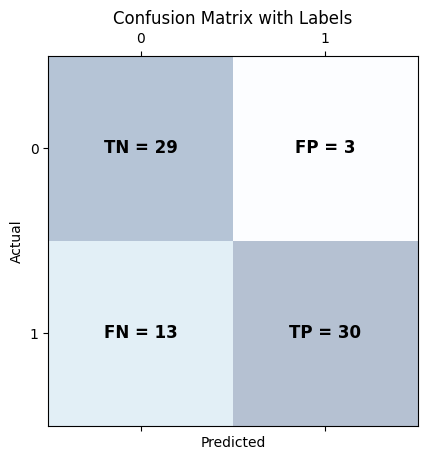

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

In [ ]:
# Find all FN indices in the full test set
FN_all = (~y_pred) & (y_test == 1)
FN_indices = y_test[FN_all].index
print("False Negative indices:", FN_indices)

False Negative indices: Index([76, 72, 225, 194, 114, 297, 219, 218, 93, 77, 220, 94, 195], dtype='int64')


In [ ]:
FN_sample_test_idx = X_test.index.get_indexer_for([76, 72, 225, 194, 114, 297, 219, 218, 93, 77, 220, 94, 195])
FN_sample_test_idx

array([ 6, 22, 26, 27, 35, 41, 43, 53, 56, 59, 64, 70, 71])

In [ ]:
CB_explainer = shap.Explainer(CatBoost_mdl)
CB_shap = CB_explainer(X_test)
print(type(CB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (CB_shap.values.shape,))
print("Data dimensions:   %s" % (CB_shap.data.shape,))

Values dimensions: (75, 6)
Data dimensions:   (75, 6)


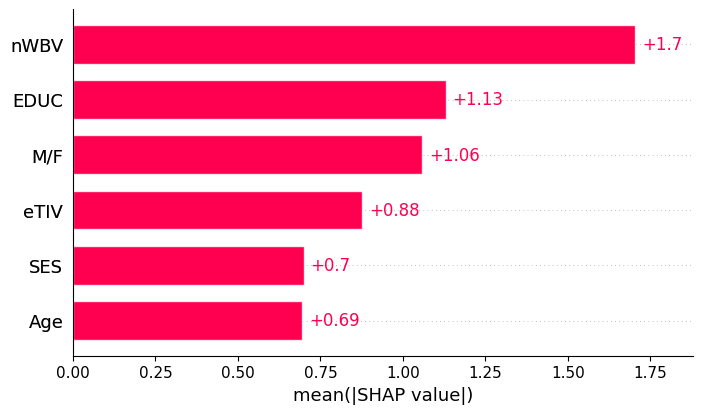

In [ ]:
sb.reset_orig()
shap.plots.bar(CB_shap)

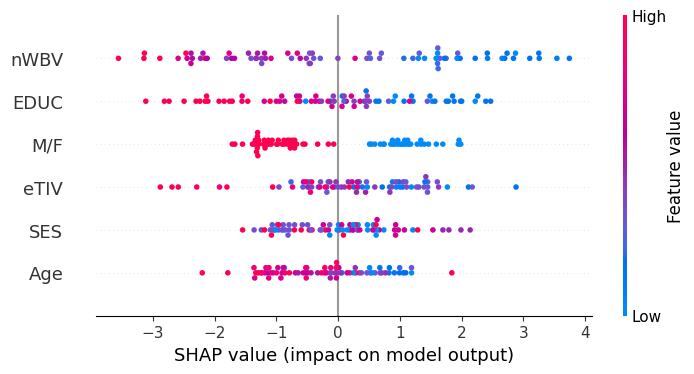

In [ ]:
shap.plots.beeswarm(CB_shap)

In [ ]:
print("X_test.iloc[11]: ")
print(X_test.iloc[11])
print(y_test.iloc[11], y_pred[11])
print("-----------------")
print("X_test.iloc[22]: ")
print(X_test.iloc[22])
print(y_test.iloc[22], y_pred[22])

X_test.iloc[11]: 
M/F        0.000
Age       72.000
EDUC      20.000
SES        1.000
eTIV    1911.000
nWBV       0.719
Name: 39, dtype: float64
1 1
-----------------
X_test.iloc[22]: 
M/F        0.000
Age       82.000
EDUC      12.000
SES        4.000
eTIV    1477.000
nWBV       0.729
Name: 72, dtype: float64
1 0


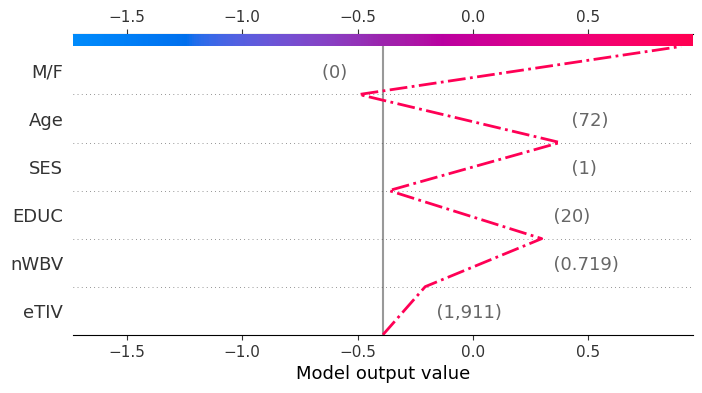

In [ ]:
# CB-TP-11
expected_value = CB_explainer.expected_value
shap.decision_plot(expected_value, CB_shap.values[11], X_test.iloc[11], highlight=0)

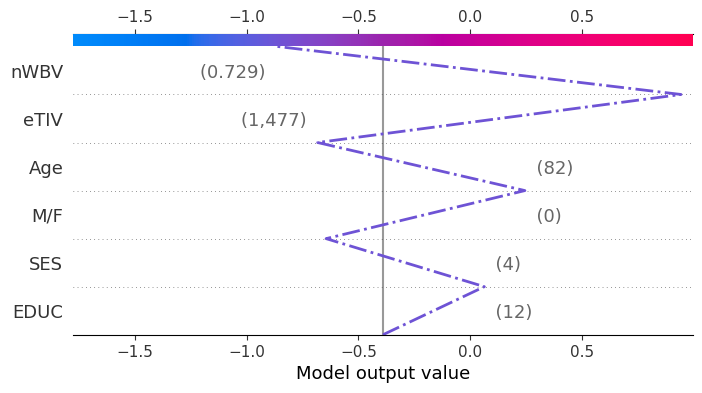

In [ ]:
# CB-FN-22
expected_value = CB_explainer.expected_value
shap.decision_plot(expected_value, CB_shap.values[22], X_test.iloc[22], highlight=0)

In [ ]:
# CB-TP-11
shap.initjs()
expected_value = CB_explainer.expected_value
shap.force_plot(expected_value, CB_shap.values[11], X_test.iloc[11])

In [ ]:
# CB-FN-22
shap.initjs()
expected_value = CB_explainer.expected_value
shap.force_plot(expected_value, CB_shap.values[22], X_test.iloc[22])

In [ ]:
lime_CB_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,
                                                   feature_names=X_test.columns,
                                                   class_names=['Nondemented', 'Demented'])

In [ ]:
# CB-TP-11
lime_CB_explainer.explain_instance(X_test.iloc[11].values,\
                                    CatBoost_mdl.predict_proba,\
                                    num_features=6).\
                                show_in_notebook(predict_proba=True)

In [ ]:
# CB-FN-22
lime_CB_explainer.explain_instance(X_test.iloc[22].values,\
                                    CatBoost_mdl.predict_proba,\
                                    num_features=6).\
                                show_in_notebook(predict_proba=True)

In [ ]:
# store all fn_results
fn_results = []
feature_counter = Counter()

CB_FN_indices = [6, 22, 26, 27, 35, 41, 43, 53, 56, 59, 64, 70, 71]

for fn_idx in CB_FN_indices:
    CB_instance_values = X_test.iloc[fn_idx].values

    exp = lime_CB_explainer.explain_instance(
        CB_instance_values,
        CatBoost_mdl.predict_proba,
        num_features=6
    )

    exp_list = exp.as_list()

    pushed_non = [f for f, w in exp_list if w < 0]
    pushed_dem = [f for f, w in exp_list if w > 0]

    fn_results.append({
        'Index': fn_idx,
        'Pushed_Nondemented': pushed_non,
        'Pushed_Demented': pushed_dem
    })

    feature_counter.update(pushed_non)

fn_df = pd.DataFrame(fn_results)

top_causes = pd.DataFrame(feature_counter.most_common(), columns=['Feature', 'Count'])

print(fn_df.head())

print("\n=== CB False Negative Feature Frequency ===")
print(top_causes)

   Index                                 Pushed_Nondemented  \
0      6  [EDUC > 16.00, 0.00 < M/F <= 1.00, 0.72 < nWBV...   
1     22  [0.72 < nWBV <= 0.75, 81.00 < Age <= 85.00, SE...   
2     26                   [0.00 < M/F <= 1.00, SES > 3.00]   
3     27  [0.00 < M/F <= 1.00, 0.72 < nWBV <= 0.75, 81.0...   
4     35  [0.00 < M/F <= 1.00, EDUC > 16.00, SES <= 2.00...   

                                     Pushed_Demented  
0                                  [eTIV <= 1363.00]  
1                       [M/F <= 0.00, EDUC <= 12.00]  
2  [EDUC <= 12.00, Age <= 73.50, 0.70 < nWBV <= 0...  
3         [EDUC <= 12.00, 1363.00 < eTIV <= 1445.00]  
4             [0.70 < nWBV <= 0.72, eTIV <= 1363.00]  

=== CB False Negative Feature Frequency ===
                     Feature  Count
0         0.00 < M/F <= 1.00     12
1                SES <= 2.00     10
2        0.72 < nWBV <= 0.75      7
3       81.00 < Age <= 85.00      7
4      15.00 < EDUC <= 16.00      4
5               EDUC > 16.00  

## Additional testing——try remove gender feature base on CATBoost (result: no improvement)

Among all three gradient boosting models, False Negative Feature Frequency top 1 is consistently 0.00 < M/F <= 1.00 which is M/F =1 (female). It might be a bias, we will try to remove gender feature to check if FN number could be decreased



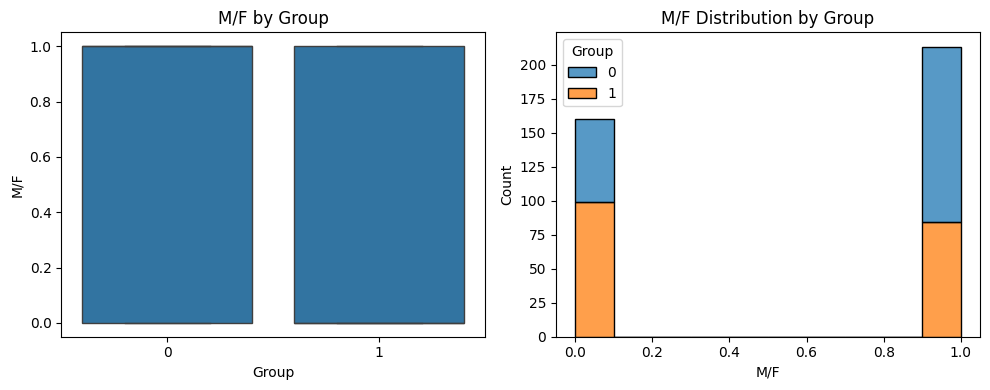

In [ ]:
# double check M/F by group
# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# First subplot: Boxplot of MMSE by Group
sb.boxplot(x='Group', y='M/F', data=df, ax=axes[0])
axes[0].set_title('M/F by Group')
axes[0].set_xlabel('Group')
axes[0].set_ylabel('M/F')

# Second subplot: Distribution of MMSE colored by Group
sb.histplot(data=df, x='M/F', hue='Group', bins=10, multiple='stack', ax=axes[1]) # or multiple='dodge'
axes[1].set_title('M/F Distribution by Group')
axes[1].set_xlabel('M/F')
axes[1].set_ylabel('Count')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
# Try remove M/F feature
X = df.drop(['Group', 'CDR', 'MMSE', 'ASF', 'M/F'], axis = 1)
y = df['Group']

# Split dataset into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_test.columns

Index(['Age', 'EDUC', 'SES', 'eTIV', 'nWBV'], dtype='object')

In [ ]:
# Initialize a CatBoost classifier
CatBoost = CatBoostClassifier(random_state=42, verbose = False)

# Define the parameter grid for Grid
CatBoost_param_dist = {
    'min_data_in_leaf': [20, 40, 60],
    'rsm': [0.7, 0.8, 1.0],
    'iterations': [100, 200],
    'depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'l2_leaf_reg': [1, 3, 5],
    'bagging_temperature': [0, 0.5, 1.0],
}

grid_search = GridSearchCV(CatBoost, CatBoost_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

CatBoost_mdl = grid_search.best_estimator_
y_pred = CatBoost_mdl.predict(X_test)

Best hyperparameters found by GridSearchCV:
{'bagging_temperature': 0, 'depth': 7, 'iterations': 200, 'l2_leaf_reg': 3, 'learning_rate': 0.1, 'min_data_in_leaf': 20, 'rsm': 0.7}


(Without gender feature)CatBoost Best hyperparameters found by GridSearchCV:
{'bagging_temperature': 0, 'depth': 7, 'iterations': 200, 'l2_leaf_reg': 3, 'learning_rate': 0.1, 'min_data_in_leaf': 20, 'rsm': 0.7}

In [ ]:
print("CatBoost: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": CatBoost_mdl.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

CatBoost: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.67      0.91      0.77        32
           1       0.91      0.67      0.77        43

    accuracy                           0.77        75
   macro avg       0.79      0.79      0.77        75
weighted avg       0.81      0.77      0.77        75

------------------------------------------------------
Accuracy: 0.7733333333333333
Precision: 0.90625
Recall: 0.6744186046511628
F1 Score: 0.7733333333333333
ROC_AUC: 0.7903343023255813
------------------------------------------------------


,Feature,Importance
3,eTIV,26.427298
4,nWBV,23.171942
1,EDUC,17.658547
0,Age,16.502023
2,SES,16.240190


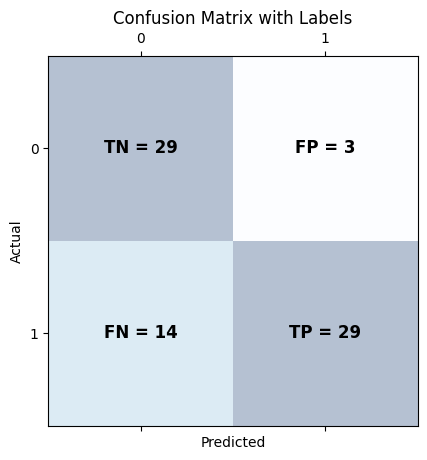

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

However, removing M/F didn't help and FN number wasn't decreased.

## Additional testing——try adding interaction features based on XGBoost

### Base on shap interaction value(top 4)_(result:No improvement)



Feature 1 Feature 2  Mean |Interaction Value|

7        Age      eTIV                  0.241632

14      eTIV      nWBV                  0.232034

1        M/F      EDUC                  0.209921

8        Age      nWBV                  0.197576

In [ ]:
X = df.drop(['Group', 'CDR', 'MMSE', 'ASF'], axis = 1)
y = df['Group']

X['Age_eTIV'] = X['Age'] * X['eTIV'] # shap interaction value top 1
X['eTIV_nWBV'] = X['eTIV'] * X['nWBV'] # shap interaction value top 2
X['M/F_EDUC'] = X['M/F'] * X['EDUC'] # shap interaction value top 3
X['Age_nWBV'] = X['Age'] * X['nWBV'] # shap interaction value top 4

In [ ]:
X.columns

Index(['M/F', 'Age', 'EDUC', 'SES', 'eTIV', 'nWBV', 'Age_eTIV', 'eTIV_nWBV',
       'M/F_EDUC', 'Age_nWBV'],
      dtype='object')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Initialize a XGBoost classifier
XGBoost= XGBClassifier(random_state=42)

# Define the parameter grid for Grid
XGB_param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'min_child_weight': [1, 3, 5],
}

grid_search = GridSearchCV(XGBoost, XGB_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

XGBoost_mdl = grid_search.best_estimator_
y_pred = XGBoost_mdl.predict(X_test)

Best hyperparameters found by GridSearchCV:
{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9}


（Base on shap interacion value, with adding interaction features）XGBoost Best hyperparameters found by GridSearchCV:
{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9}

In [ ]:
print("XGBoost: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": XGBoost_mdl.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

XGBoost: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.63      0.91      0.74        32
           1       0.90      0.60      0.72        43

    accuracy                           0.73        75
   macro avg       0.76      0.76      0.73        75
weighted avg       0.78      0.73      0.73        75

------------------------------------------------------
Accuracy: 0.7333333333333333
Precision: 0.896551724137931
Recall: 0.6046511627906976
F1 Score: 0.7222222222222222
ROC_AUC: 0.7554505813953488
------------------------------------------------------


,Feature,Importance
8,M/F_EDUC,0.218983
7,eTIV_nWBV,0.119167
5,nWBV,0.115466
0,M/F,0.100103
3,SES,0.086504
9,Age_nWBV,0.081056
2,EDUC,0.077759
4,eTIV,0.072399
6,Age_eTIV,0.071133
1,Age,0.057431


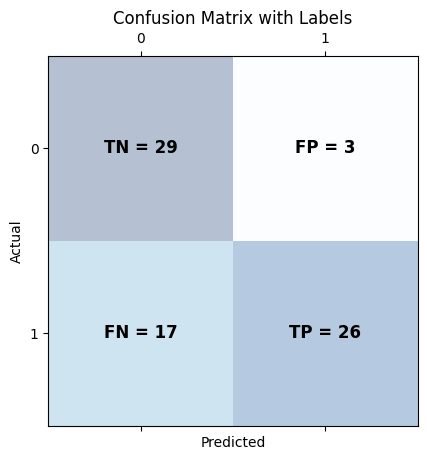

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

In [ ]:
XGB_explainer = shap.Explainer(XGBoost_mdl)
XGB_shap = XGB_explainer(X_test)
print(type(XGB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (XGB_shap.values.shape,))
print("Data dimensions:   %s" % (XGB_shap.data.shape,))

Values dimensions: (75, 10)
Data dimensions:   (75, 10)


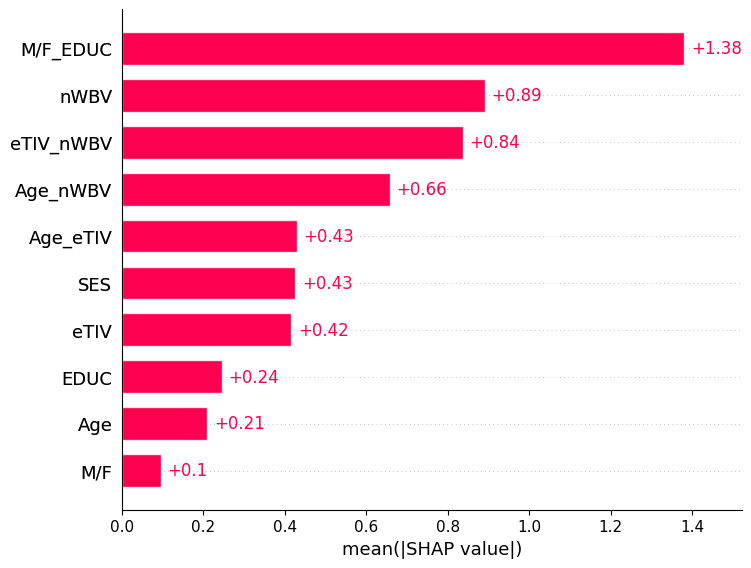

In [ ]:
sb.reset_orig()
shap.plots.bar(XGB_shap)

Result：no-improvement

Possible Explaination：

XGBoost is inherently capable of capturing feature interactions. As a tree-based model, the combination of split features along a path naturally represents feature interactions (for example, a path that first splits on M/F and then on Age is essentially an interaction).

Therefore, if we select the top pairs based on SHAP interaction values, it’s very likely that these interactions have already been utilized by the tree structure of the model.

Manually adding a “multiplied” interaction feature in such cases does not provide new information but rather duplicates what the model already knows， because the information gain is minimal, and the performance change is negligible.

### Base on correlation coefficient_(result: slight improvement)

In [ ]:
X = df.drop(['Group', 'CDR', 'MMSE', 'ASF'], axis = 1)
y = df['Group']

X['Age_nWBV'] = X['Age'] * X['nWBV'] # correlation coefficient is 0.57, ref: nWBV is inversely related to age, meaning it tends to decrease with increasing age.
X['M/F_eTIV'] = X['M/F'] * X['eTIV'] # correlation coefficient is 0.52, ref:There is a well-established relationship between gender and Estimated Total Intracranial Volume (eTIV), with males, on average, demonstrating larger eTIV than females.
X['SEC_EDUC'] = X['EDUC'] * X['SES'] # correlation coefficient is 0.71, make sense, longer education normally leads to higher Socioeconomic status (SES) and vice versa

In [ ]:
X.columns

Index(['M/F', 'Age', 'EDUC', 'SES', 'eTIV', 'nWBV', 'Age_nWBV', 'M/F_eTIV',
       'SEC_EDUC'],
      dtype='object')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### XGBoost

In [ ]:
# Initialize a XGBoost classifier
XGBoost= XGBClassifier(random_state=42)

# Define the parameter grid for Grid
XGB_param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'min_child_weight': [1, 3, 5],
}

grid_search = GridSearchCV(XGBoost, XGB_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

XGBoost_mdl = grid_search.best_estimator_
y_pred = XGBoost_mdl.predict(X_test)

Best hyperparameters found by GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}


（Base on correlation coefficient, with adding interaction features）XGBoost Best hyperparameters found by GridSearchCV:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}

In [ ]:
print("XGBoost: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))
print("------------------------------------------------------")

# Get feature importances
feature_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": XGBoost_mdl.feature_importances_
})

feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
feature_importances

XGBoost: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.69      0.91      0.78        32
           1       0.91      0.70      0.79        43

    accuracy                           0.79        75
   macro avg       0.80      0.80      0.79        75
weighted avg       0.82      0.79      0.79        75

------------------------------------------------------
Accuracy: 0.7866666666666666
Precision: 0.9090909090909091
Recall: 0.6976744186046512
F1 Score: 0.7894736842105263
ROC_AUC: 0.8019622093023255
------------------------------------------------------


,Feature,Importance
5,nWBV,0.140883
7,M/F_eTIV,0.133115
0,M/F,0.131345
2,EDUC,0.122719
8,SEC_EDUC,0.108092
6,Age_nWBV,0.094661
4,eTIV,0.092062
3,SES,0.091329
1,Age,0.085794


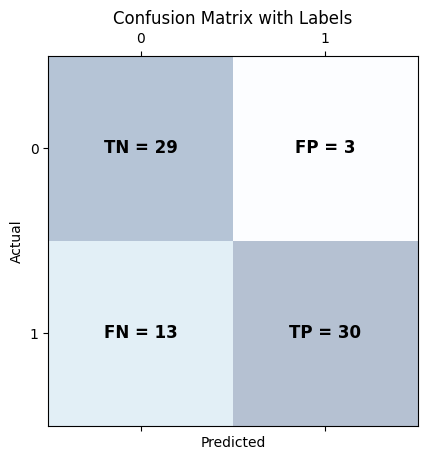

In [ ]:
cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

labels = np.array([
    [f"TN = {tn}", f"FP = {fp}"],
    [f"FN = {fn}", f"TP = {tp}"]
])

fig, ax = plt.subplots()
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(2):
    for j in range(2):
        ax.text(j, i, labels[i, j],
                va='center', ha='center', fontsize=12, fontweight='bold')

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix with Labels")
plt.show()

In [ ]:
XGB_explainer = shap.Explainer(XGBoost_mdl)
XGB_shap = XGB_explainer(X_test)
print(type(XGB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (XGB_shap.values.shape,))
print("Data dimensions:   %s" % (XGB_shap.data.shape,))

Values dimensions: (75, 9)
Data dimensions:   (75, 9)


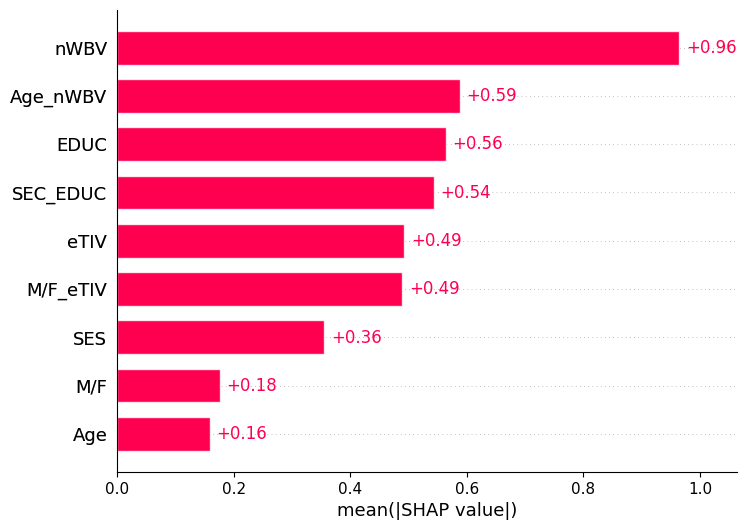

In [ ]:
sb.reset_orig()
shap.plots.bar(XGB_shap)

Result：slight improvement

Possible explaination: The interaction features we selected based on high correlation coefficients are likely linear or near-linear combinations that the model hasn’t fully exploited yet.

In this method, the feature pairs with correlation > 0.5 (three pairs) probably have strong linear or near-linear relationships. While XGBoost can capture nonlinear interactions, it may not directly and fully leverage such multiplicative relationships between continuous numerical features.

By manually adding the product terms, we provided the model with new, explicitly separable dimensions, which resulted in a slight improvement.

So continue train LightGBM and CatBoost on new features

#### LightGBM

In [ ]:
# Initialize a LightGBM classifier
LightGBM= LGBMClassifier(random_state=42, verbosity=-1)

# Define the parameter grid for Grid
LightGBM_param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'num_leaves': [31, 50, 70],
}

grid_search = GridSearchCV(LightGBM, LightGBM_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

LightGBM_mdl = grid_search.best_estimator_
y_pred = LightGBM_mdl.predict(X_test)

[LightGBM] [Info] Number of positive: 140, number of negative: 158
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 394
[LightGBM] [Info] Number of data points in the train set: 298, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.469799 -> initscore=-0.120953
[LightGBM] [Info] Start training from score -0.120953
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

（Base on correlation coefficient, with adding interaction features) LightGBM Best hyperparameters found by GridSearchCV:
{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 31}

In [ ]:
print("LightGBM: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))

LightGBM: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.64      0.88      0.74        32
           1       0.87      0.63      0.73        43

    accuracy                           0.73        75
   macro avg       0.75      0.75      0.73        75
weighted avg       0.77      0.73      0.73        75

------------------------------------------------------
Accuracy: 0.7333333333333333
Precision: 0.8709677419354839
Recall: 0.627906976744186
F1 Score: 0.7297297297297297
ROC_AUC: 0.751453488372093


In [ ]:
LGB_explainer = shap.Explainer(LightGBM_mdl)
LGB_shap = LGB_explainer(X_test)
print(type(LGB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (LGB_shap.values.shape,))
print("Data dimensions:   %s" % (LGB_shap.data.shape,))

Values dimensions: (75, 9)
Data dimensions:   (75, 9)


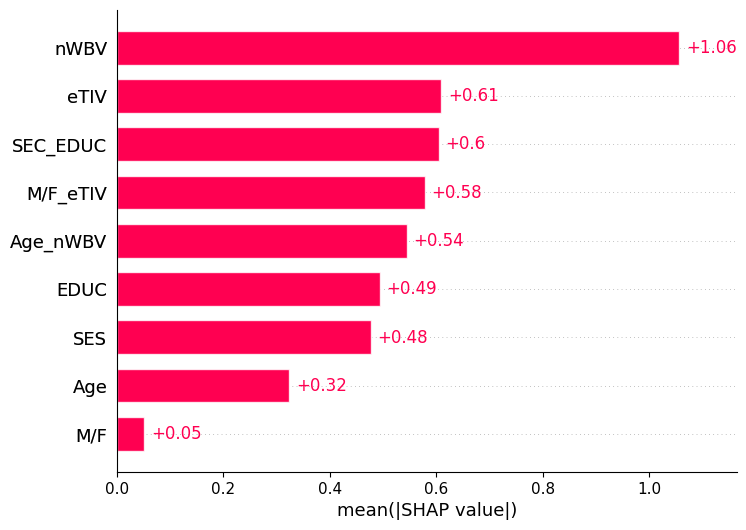

In [ ]:
sb.reset_orig()
shap.plots.bar(LGB_shap)

#### CatBoost

In [ ]:
# Initialize a CatBoost classifier
CatBoost = CatBoostClassifier(random_state=42, verbose = False)

# Define the parameter grid for Grid
CatBoost_param_dist = {
    'min_data_in_leaf': [20, 40, 60],
    'rsm': [0.7, 0.8, 1.0],
    'iterations': [100, 200],
    'depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1],
    'l2_leaf_reg': [1, 3, 5],
    'bagging_temperature': [0, 0.5, 1.0],
}

grid_search = GridSearchCV(CatBoost, CatBoost_param_dist, cv=5, scoring='recall', n_jobs=-1)
grid_search.fit(X_train, y_train)
print("Best hyperparameters found by GridSearchCV:")
print(grid_search.best_params_)

CatBoost_mdl = grid_search.best_estimator_
y_pred = CatBoost_mdl.predict(X_test)

Best hyperparameters found by GridSearchCV:
{'bagging_temperature': 0, 'depth': 5, 'iterations': 200, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'min_data_in_leaf': 20, 'rsm': 0.8}


（Base on correlation coefficient, with adding interaction features)
CatBoost Best hyperparameters found by GridSearchCV:
{'bagging_temperature': 0, 'depth': 7, 'iterations': 200, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'min_data_in_leaf': 20, 'rsm': 1.0}

In [ ]:
print("CatBoost: ")
print("\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred))
print("------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC_AUC:", roc_auc_score(y_test, y_pred))

CatBoost: 

Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.71      0.94      0.81        32
           1       0.94      0.72      0.82        43

    accuracy                           0.81        75
   macro avg       0.83      0.83      0.81        75
weighted avg       0.84      0.81      0.81        75

------------------------------------------------------
Accuracy: 0.8133333333333334
Precision: 0.9393939393939394
Recall: 0.7209302325581395
F1 Score: 0.8157894736842105
ROC_AUC: 0.8292151162790697


In [ ]:
CB_explainer = shap.Explainer(CatBoost_mdl)
CB_shap = CB_explainer(X_test)
print(type(CB_explainer))

<class 'shap.explainers._tree.TreeExplainer'>


In [ ]:
print("Values dimensions: %s" % (CB_shap.values.shape,))
print("Data dimensions:   %s" % (CB_shap.data.shape,))

Values dimensions: (75, 9)
Data dimensions:   (75, 9)


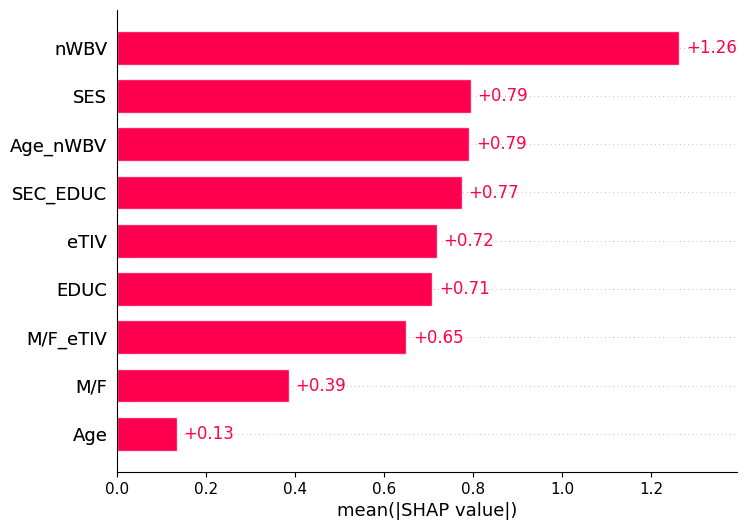

In [ ]:
sb.reset_orig()
shap.plots.bar(CB_shap)